<details>
   <summary>Metadata</summary>
    title: "E-TRAINEE Tutorial - Point cloud exploration with Python"<br>
    description: "This is a tutorial within the second theme of Module 1 of the E-TRAINEE course."<br>
    lastUpdate: 2023-07-17<br>
    authors: Andreas Mayr<br>
</details>

# Point cloud exploration with Python

A Notebook to explore a 3D point cloud with various state-of-the-art Python packages specialized on large datasets. Different options for loading and visualizing point clouds quickly in a 2D map view are shown.

The packages needed for this tutorial are contained in the requirements file provided for the course. Please see the instructions on the [software page](https://3dgeo-heidelberg.github.io/etrainee/software/software_python.html) for setting up a Conda environment based on this file.

Data:

Use the `pc_subset_hut.las` point cloud or try with your own one. The `pc_subset_hut.las` is a small subset of a point cloud acquired by unmanned aerial vehicle laser scanning (details in [Mayr et al. 2020](https://doi.org/10.5194/isprs-annals-V-2-2020-765-2020)) and covers a small area in the Dolomites (IT), including the buildings of a mountain hut.

## Handling point clouds with Vaex

[Vaex](https://vaex.readthedocs.io/en/latest/index.html) is a Python library for lazy Out-of-Core DataFrames (similar to Pandas), to visualize and explore big tabular datasets. Let's see how this can be used with point clouds.

### Reading files

#### Read LAS file to Vaex dataframe

In [1]:
import laspy
import vaex
import pandas as pd
import pathlib

In [3]:
data_dir = pathlib.Path('C:/work/etrainee/point_clouds')    # Define path on your local system
data_dir

WindowsPath('C:/work/etrainee/point_clouds')

In [4]:
PC_las = data_dir / 'pc_subset_hut.las'
#PC_las = data_dir / 'ahk_2020_uls.laz'             # use AHK rock glacier point cloud (lacks intensity values)

# read LAS file to Vaex dataframe (with selected attributes, e.g. intensity)
inFile = laspy.read(PC_las)
vdf_las = vaex.from_dict({'X': inFile.x, 'Y': inFile.y, 'Z': inFile.z, 'intensity': inFile.intensity})
print(f'preview the first rows\n: {vdf_las.head(5)}')
print(f'column names: {vdf_las.column_names}')

print(f'number of rows: {vdf_las.shape[0]:,}')
print(f'number of columns: {vdf_las.shape[1]}')

preview the first rows
:   #       X            Y        Z    intensity
  0  714607  5.16844e+06  2333.22        39255
  1  714610  5.16844e+06  2334.51        38425
  2  714609  5.16844e+06  2334.6         38971
  3  714609  5.16844e+06  2334.76        38053
  4  714609  5.16844e+06  2334.93        39823
column names: ['X', 'Y', 'Z', 'intensity']
number of rows: 4,839,997
number of columns: 4


Export the point cloud to CSV (using `pandas_df.to_csv` under the hood):

In [32]:
%%time
PC_csv = data_dir / 'pc_subset_hut.csv'
vdf_las.export_csv(PC_csv)

CPU times: total: 23.9 s
Wall time: 27.1 s


Compare this to the speed of using the Apache Arrow backend:

In [5]:
%%time
PC_csv = data_dir / 'pc_subset_hut.csv'
vdf_las.export_csv_arrow(PC_csv)

CPU times: total: 3.77 s
Wall time: 4.32 s


#### Read CSV file to Vaex dataframe

The `vaex.open` method reads a CSV file lazily, i.e. the data is streamed when needed for computations. This is useful when your data is larger the available memory. In this case, however, we use `vaex.from_csv` to read into memory.

In [6]:
vdf = vaex.from_csv(PC_csv)    # read textfile (csv) to Vaex dataframe (use sep='\t' if your data is tab-separated)
vdf.head(n=5)

#,X,Y,Z,intensity
0,714607,5.16844e+06,2333.22,39255
1,714610,5.16844e+06,2334.51,38425
2,714609,5.16844e+06,2334.6,38971
3,714609,5.16844e+06,2334.76,38053
4,714609,5.16844e+06,2334.93,39823


### Memory efficient out-of-core processing

By specifying the ```convert=True``` argument, large CSVs (larger than memory) can be read in chunks, converted to the memory-mappable [HDF5](https://en.wikipedia.org/wiki/Hierarchical_Data_Format) format and written to disk (first as one temporary HDF5 file per chunk, then concatenated into one HDF5, hence requiring twice the disk space of the final HDF5 file). This frees memory, and allows you to efficiently work *out-of-core*.

The syntax to do this is quite simple even for multiple files (e.g. a tiled point cloud; see the documentation [here](https://vaex.readthedocs.io/en/latest/guides/io.html#Text-based-file-formats)), and very straightforward for a single CSV file:

In [35]:
vdf = vaex.from_csv(PC_csv, convert=True, chunk_size=5_000_000, progress=True, copy_index=True)    # Does not make much sense with only 4.8M points, try with a larger point cloud.

Here, we also copied the index column of the Pandas DataFrame as a regular column (just to demonstrate the option).

### Visualization with Vaex

Let's plot histograms directly from the Vaex dataframe, first the elevation ...

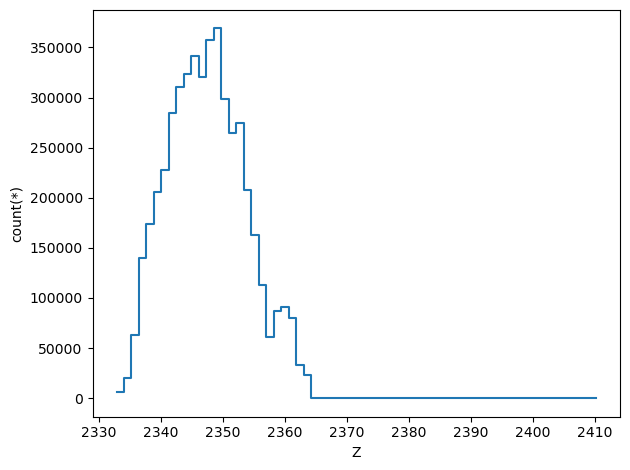

In [7]:
vdf.viz.histogram(vdf.Z)

... then the intensity values:

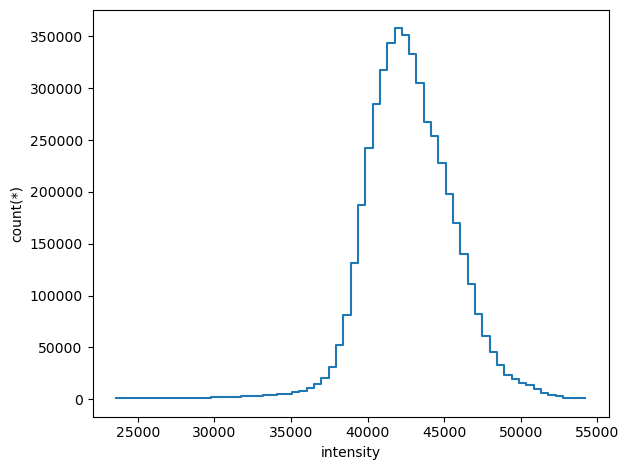

In [8]:
vdf.viz.histogram(vdf.intensity, limits='99.7%')

Now we plot 2D maps with aggregating the mean and standard deviation of the Z value (i.e. elevation in meters) per visualization cell, as well as the number of points.
Note that we set the ```aspect``` parameter to fix the axis aspect ratio (and prevent a spatial distortion).
See the [Vaex documentation](https://vaex.readthedocs.io/en/latest/api.html#vaex.viz.DataFrameAccessorViz.heatmap) for more options.

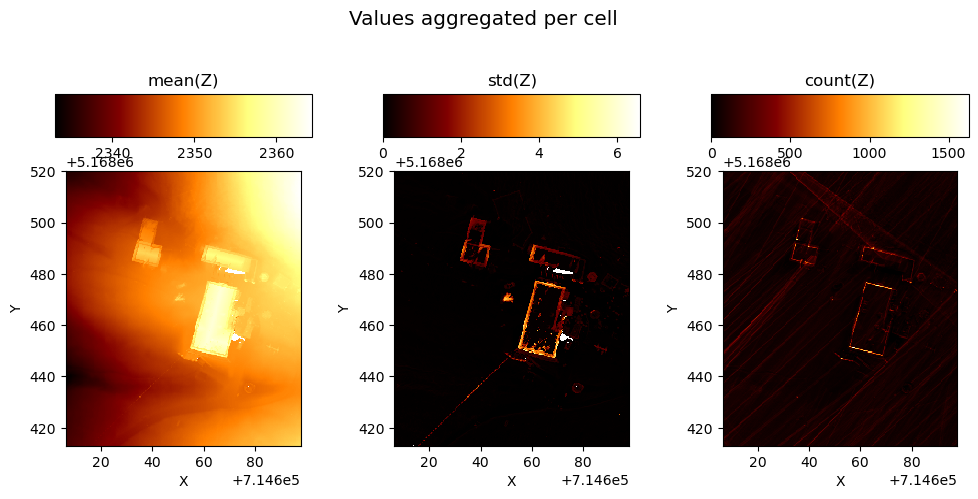

In [9]:
#vdf.viz.heatmap(vdf.X, vdf.Y, what=vaex.stat.mean(vdf.Z), colorbar=False) # With a single plot there seems to be a problem with colorbar placement.
vdf.viz.heatmap(vdf.X, vdf.Y, what=[vaex.stat.mean(vdf.Z), vaex.stat.std(vdf.Z), vaex.stat.count(vdf.Z)],
                title="Values aggregated per cell",
                aspect="equal",
                figsize=(10, 5))

## More Vaex tools

Vaex offers other tools you may find useful for handling 3D point clouds, such as:
- [Geo operations](https://vaex.readthedocs.io/en/latest/api.html#geo-operations) - For "clipping-like" geometric operations, e.g. ```inside_polygons()```?
- Fast [group-by operations](https://vaex.readthedocs.io/en/latest/tutorial.html#Group-by)
- [Arrow support](https://vaex.readthedocs.io/en/latest/guides/arrow.html#) - Make use of the [Arrow](https://arrow.apache.org/) memory format capable of zero-copy reads for fast data access, visualizing quick overviews, shallow copies, and creating new virtual columns.
- [Machine learning](https://vaex.readthedocs.io/en/latest/tutorial_ml.html) - ```vaex.ml``` offers ML functionality, including a fast and scalable K-means clustering implementation and many other tools.
- [Propagation of uncertainties](https://vaex.readthedocs.io/en/latest/tutorial.html#Propagation-of-uncertainties)
- For more point cloud plotting examples see: https://examples.pyviz.org/ and https://examples.pyviz.org/seattle_lidar/Seattle_Lidar.html#seattle-lidar-gallery-seattle-lidar

## Datashader

Let's try plotting from Pandas DataFrames with [Datashader](https://datashader.org/index.html), a toolset for rendering graphics of large datasets quickly and conveniently.

First we load a point cloud in csv format as Pandas DataFrame.

In [10]:
import pandas as pd
df = pd.read_csv(PC_csv)                    # load point cloud as pandas dataframe

Now import the required packages and use Datashader to quickly plot a 2D planimetric view of our point cloud, where the colors represent the 2D point density.

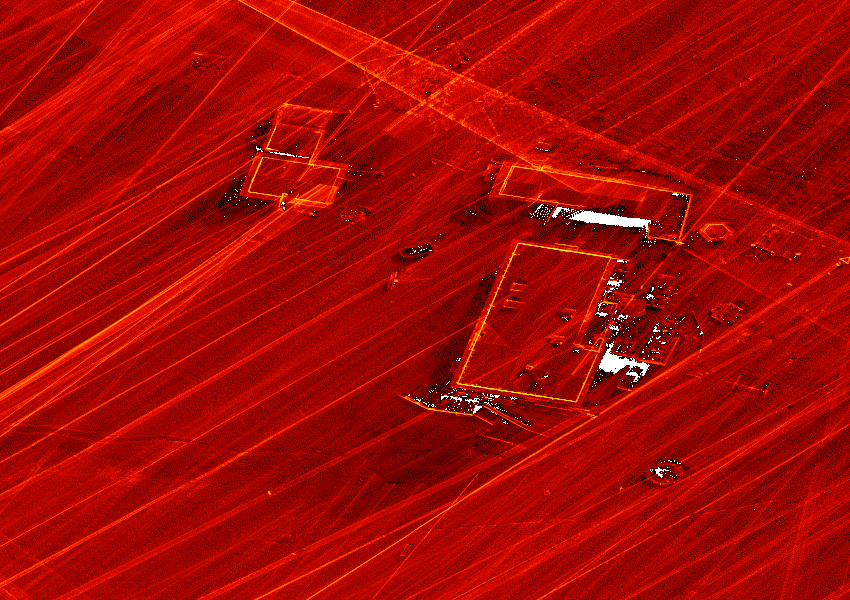

In [11]:
import colorcet
import datashader as ds, datashader.transfer_functions as tf

cvs = ds.Canvas(plot_width=850)
agg = cvs.points(df, 'X', 'Y')                  # we plot the point density
tf.shade(agg, cmap=colorcet.fire, how='log')    # plot with fire colormap and log colorscale

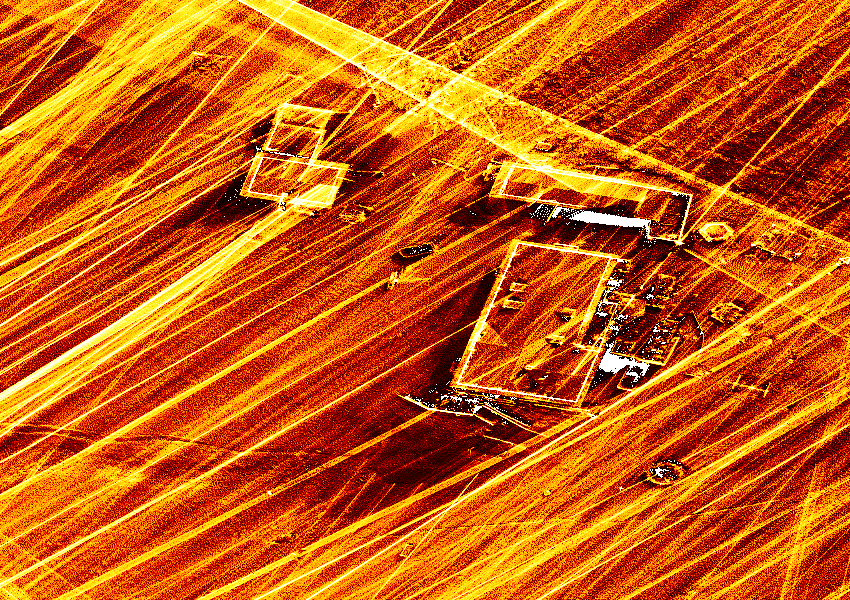

In [12]:
tf.shade(agg, cmap=colorcet.fire, how='eq_hist')    # plot with fire colormap and histogram equalization

... and we plot the maximum elevation per bin:

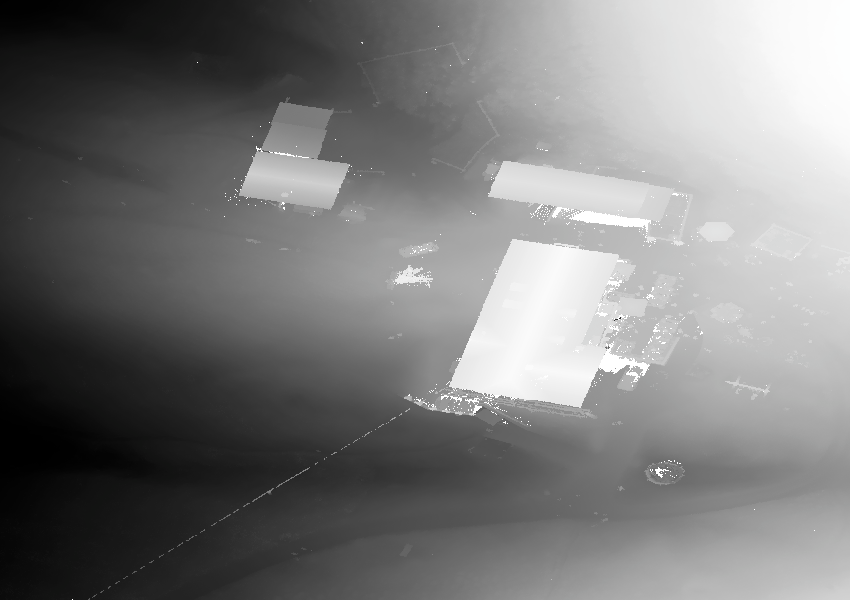

In [13]:
agg = cvs.points(df, 'X', 'Y', ds.max('Z'))                  # we plot the maximum elevation per bin
tf.shade(agg, cmap=colorcet.gray)

Now we create an interactive version of the map, using Holoviews with the Bokeh plotting backend and again with datashader for fast rendering. We switch to aggregating the standard deviation of z-values per bin.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
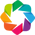

:DynamicMap   []
   :RGB   [X,Y]   (R,G,B,A)

In [14]:
import holoviews.operation.datashader as hd
import holoviews as hv

hv.extension('bokeh')
shaded = hd.datashade(hv.Points(df, ['X', 'Y']), cmap=colorcet.bmy, aggregator=ds.std('Z'))
hd.dynspread(shaded, threshold=0.5, max_px=4).opts(bgcolor='black', xaxis=None, yaxis=None, width=900, height=500)

## hvPlot

The next plotting option we try is [hvPlot](https://hvplot.holoviz.org/index.html), which provides a high-level plotting API built on HoloViews. By specifying ```rasterize```, we get a colorbar and the possibility to fix the axes aspect ratio (preventing spatial distortion). This uses datashader to aggregate the data into a viewable image, but to get a logarithmic colorscale we must use hvPlot's option ```logz()``` (using datashader directly it would be how='log'). See the [user guide](https://hvplot.holoviz.org/user_guide/Customization.html) for more customization options.

In [15]:
import hvplot.pandas
# Make colors represent point density
df.hvplot.scatter(x='X', y='Y', rasterize=True, aspect="equal", logz=True, title='Point count')

:DynamicMap   []
   :Image   [X,Y]   (X_Y Count)

In [17]:
df.hvplot.scatter(x='X', y='Y', rasterize=True, aggregator=ds.std('Z'), aspect="equal", title='Elevation standard deviation [m]')

:DynamicMap   []
   :Image   [X,Y]   (X_Y Z)

Now we want to use the Matplotlib plotting backend (instead of the default Bokeh backend) and show map along with a histogram.

:Layout
   .DynamicMap.I :DynamicMap   []
      :Image   [X,Y]   (X_Y Z)
   .Histogram.I  :Histogram   [Z]   (Z_count)
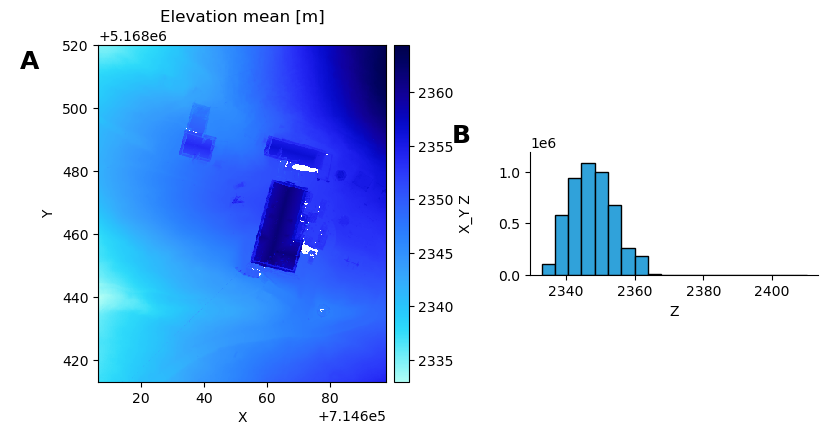

In [18]:
hvplot.extension('matplotlib')

(df.hvplot.scatter(x='X', y='Y', rasterize=True, aggregator=ds.mean('Z'), aspect="equal", title='Elevation mean [m]') +
df.hvplot.hist('Z'))

Maybe try also [GeoPandas](https://hvplot.holoviz.org/user_guide/Geographic_Data.html) and [spatialpandas](https://hvplot.holoviz.org/user_guide/Geographic_Data.html#spatialpandas)!